In [1]:
import yaml
import numpy as np
import pandas as pd
import lhapdf as lh
import matplotlib.pyplot as plt
import MatplotlibSettings
from collections import deque
import copy
import os
from os import listdir
pd.set_option("display.max_rows", None, "display.max_columns", None)

In [2]:
# PATH's
FIT_FOLDER = "../Results/map_fits/250107-ac-lambda"
DATA_FOLDER = "../Data"

In [16]:
def ylabel_extractor(dat_file_name):
  with open(DATA_FOLDER + "/" + dat_file_name, "r") as file:
    data_file = yaml.safe_load(file)
  return data_file['dependent_variables'][0]['header']['ylabelpy']

def binint_extractor(dat_file_name):
  with open(DATA_FOLDER + "/" + dat_file_name, "r") as file:
    data_file = yaml.safe_load(file)
  qualifiers = data_file['dependent_variables'][0]['qualifiers']
  integrate = next(
    (
      md['integrate']
      for md in qualifiers
      if md['name'] == 'z'
    ),
    None
)
  return integrate

def xlim_extractor(dat_file_name):
  with open(DATA_FOLDER + "/" + dat_file_name, "r") as file:
    data_file = yaml.safe_load(file)
  qualifiers = data_file['dependent_variables'][0]['qualifiers']
  xlim = next(
    (
      [md['low']+  , md['high']]
      for md in qualifiers
      if md['name'] == 'z'
    ),
    None
)
  return xlim

In [4]:
# Config file
with open(FIT_FOLDER + "/config.yaml", "r") as file:
  config_file = yaml.safe_load(file)

dat_sets_list = config_file['Data']['sets']

In [5]:
config_file['Data']['sets'][0]['name']

'ALEPH $\\Lambda \\bar{\\Lambda}$'

In [6]:
# Read and report chi2's
with open(FIT_FOLDER + "/Chi2s.yaml", "r") as chi2file:
    for chi2 in yaml.load(chi2file, Loader = yaml.CLoader):
        for c in chi2.items(): 
            print(c[0],"(Npt = ",c[1]["Npt"],"): chi2 = ", c[1]["chi2"])

ALEPH $\Lambda \bar{\Lambda}$ (Npt =  25 ): chi2 =  0.5680153884882213
ARGUS $\Lambda \bar{\Lambda}$ (Npt =  16 ): chi2 =  1.3333456378069166
BELLE $\Lambda \bar{\Lambda}$ (Npt =  15 ): chi2 =  0.45796813725438723
CELLO $\Lambda \bar{\Lambda}$ (Npt =  7 ): chi2 =  0.5872051405902564
Delphi 91.2 GeV $\Lambda \bar{\Lambda}$ (Npt =  11 ): chi2 =  4.6785326863250996
Delphi 183 GeV $\Lambda \bar{\Lambda}$ (Npt =  5 ): chi2 =  9.694207100156929
Delphi 189 GeV $\Lambda \bar{\Lambda}$ (Npt =  5 ): chi2 =  26.947740780288832
HRS $\Lambda \bar{\Lambda}$ (Npt =  12 ): chi2 =  0.9471199213552389
MARK II $\Lambda \bar{\Lambda}$ (Npt =  15 ): chi2 =  2.9771424689526116
OPAL $\Lambda \bar{\Lambda}$ (Npt =  15 ): chi2 =  0.8217822987979334
SLD B $\Lambda \bar{\Lambda}$ (Npt =  8 ): chi2 =  0.4690821268128267
SLD C $\Lambda \bar{\Lambda}$ (Npt =  8 ): chi2 =  0.8569080155832035
SLD UDS $\Lambda \bar{\Lambda}$ (Npt =  8 ): chi2 =  1.5557898943081496
SLD $\Lambda \bar{\Lambda}$ (Npt =  16 ): chi2 =  0.65

In [25]:
# Plot settings
exps = [data['name'] for data in dat_sets_list]
plotfiles = dict(zip(exps, [data['file'].removesuffix('.yaml') for data in dat_sets_list]))
ylabels = dict(zip(exps, [ylabel_extractor(data['file']) for data in dat_sets_list]))
binints = dict(zip(exps, [binint_extractor(data['file']) for data in dat_sets_list]))
xlims = dict(zip(exps, [xlim_extractor(data['file']) for data in dat_sets_list]))

# Set Default
xlog = dict(zip(exps, [
    False,
    False,
    False,
    False,
    False,
    False,
    False,
    False,
    False,
    False,
    False,
    False,
    False,
    False,
    False,
    False,
    False,
    False,
    False,
]))


ylims1 = dict(zip(exps, [
    [-0.05, 0.1],
    [0, 2],
    [0, 2],
    [0, 2],
    [0, 2],
    [0, 2],
    [5e3, 3e7],
    [2e-3, 10],
    [0.8, 30],
    [0.05, 20],
    [0.02, 15],
    [0.02, 200],
    [0.2, 7],
    [0.05, 200],
    [0.2, 300],
    [0.8, 10],
    [0.03, 1000],
    [0.00005, 10],
    [0.0002, 10],
]))

ylims2 = dict(zip(exps, [
    [0.6, 1.4],
    [0.6, 1.4],
    [0.6, 1.4],
    [0.6, 1.4],
    [0.5, 1.5],
    [0.5, 1.5],
    [0.8, 1.2],
    [0.95, 1.05],
    [0.5, 1.5],
    [0.5, 1.5],
    [0.5, 1.5],
    [0.5, 1.5],
    [0.5, 1.5],
    [0.5, 1.5],
    [0.5, 1.5],
    [0.5, 1.5],
    [0.5, 1.5],
    [0.8, 1.2]
]))

# Create plots folder
if not os.path.exists(FIT_FOLDER + "/plots"):
    os.makedirs(FIT_FOLDER + "/plots")

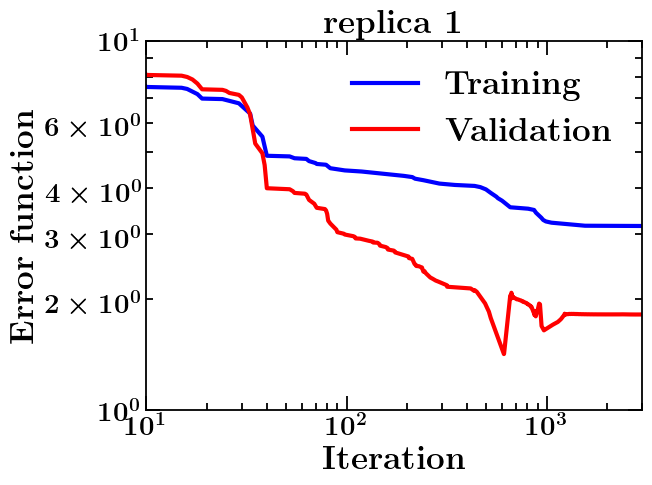

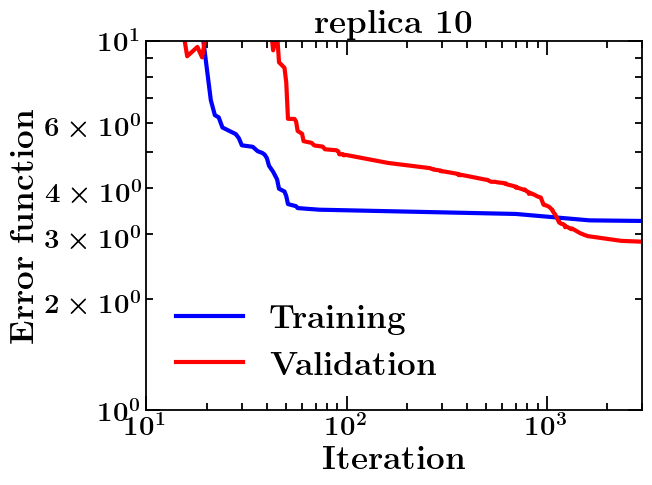

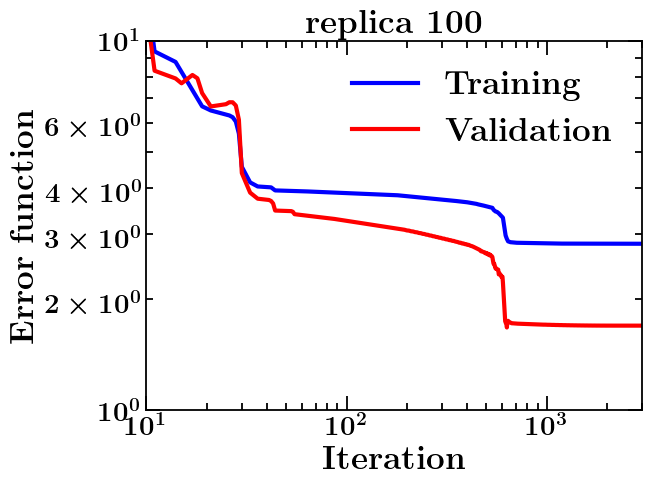

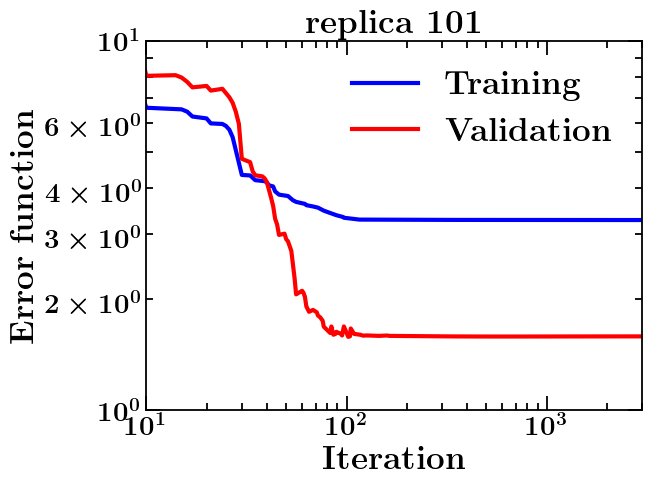

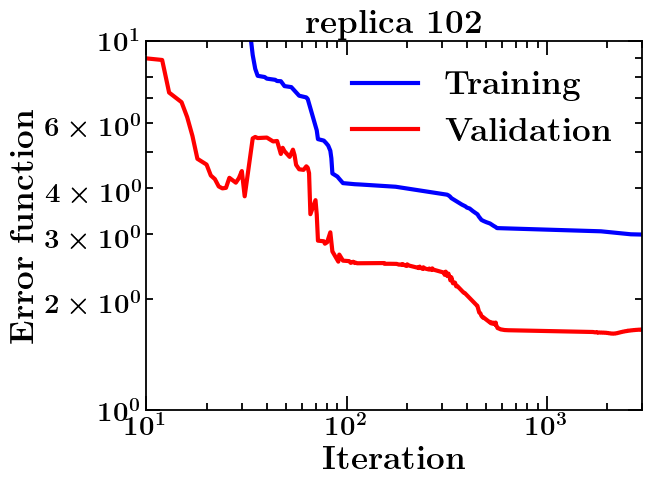

...

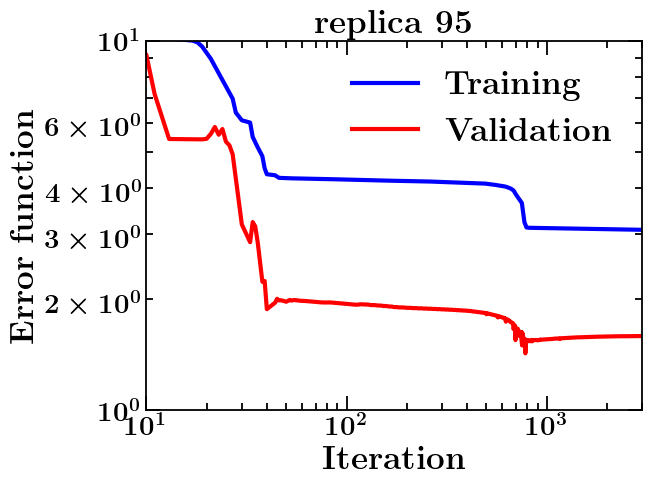

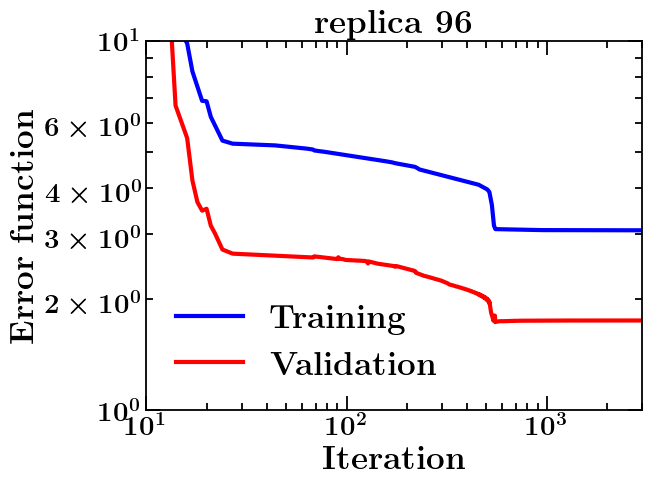

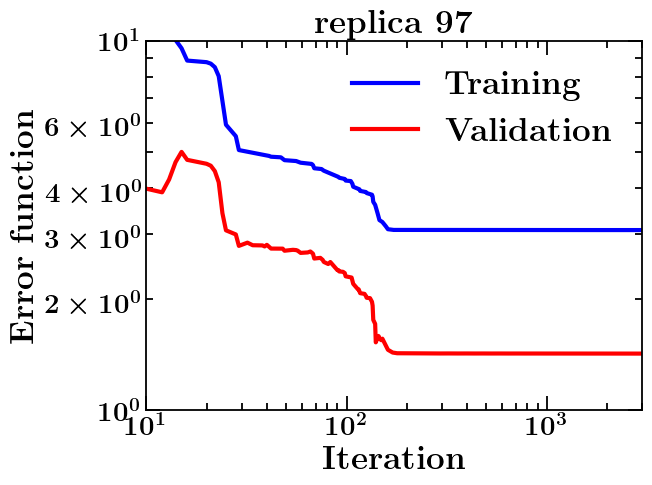

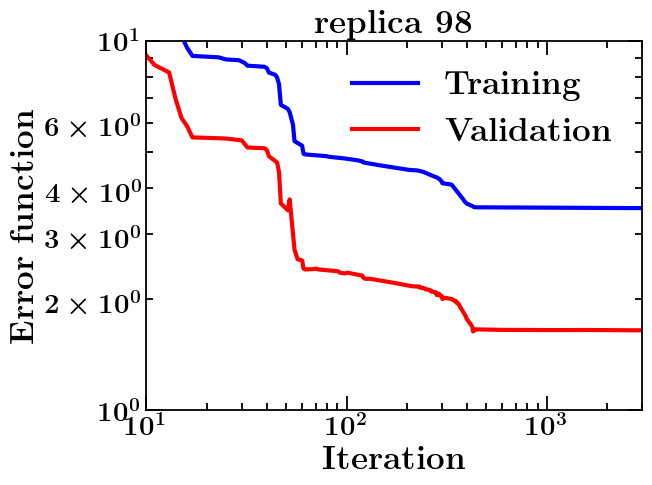

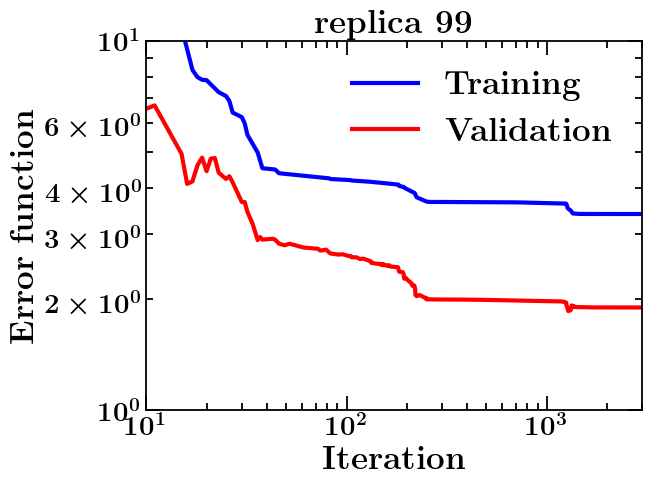

In [8]:
# Chi2 profiles
for frep in [f.replace(".yaml", "") for f in sorted(listdir(FIT_FOLDER + "/log/"))]:
    with open(FIT_FOLDER + "/log/" + frep + ".yaml", "r") as rep:
        replica = yaml.load(rep, Loader = yaml.CLoader)
        ite   = [r["iteration"]       for r in replica]
        chi2t = [r["training chi2"]   for r in replica]
        chi2v = [r["validation chi2"] for r in replica]
        
        plt.title(r"\textbf{" + frep.replace("_", " ") + "}")
        plt.ylabel(r"\textbf{Error function}")
        plt.xlabel(r"\textbf{Iteration}")
        plt.xscale("log")
        plt.yscale("log")
        plt.ylim(1, 10)
        plt.xlim(10, 3000)
        plt.plot(ite, chi2t, color = "blue", label = r"\textbf{Training}")
        plt.plot(ite, chi2v, color = "red",  label = r"\textbf{Validation}")
        plt.legend()
        #plt.savefig(FIT_FOLDER + "/" + frep + ".pdf")
        plt.show()
        plt.close()

ALEPH $\Lambda \bar{\Lambda}$
exun [0.35   0.3    0.29   0.21   0.18   0.16   0.15   0.14   0.11   0.09
 0.06   0.04   0.03   0.023  0.018  0.015  0.013  0.01   0.008  0.007
 0.006  0.005  0.003  0.0019 0.0012]
excv [2.97e+00 3.43e+00 3.74e+00 3.70e+00 3.69e+00 3.68e+00 3.70e+00 3.41e+00
 3.18e+00 2.66e+00 2.04e+00 1.52e+00 1.19e+00 9.56e-01 7.71e-01 6.30e-01
 5.28e-01 4.08e-01 2.69e-01 1.82e-01 1.29e-01 7.80e-02 3.50e-02 1.18e-02
 2.60e-03]


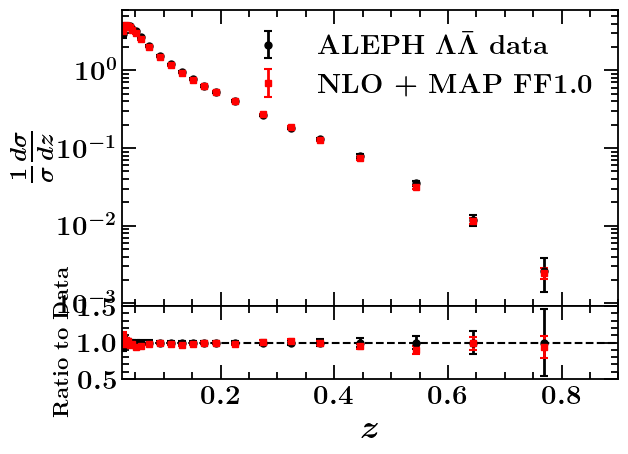

ARGUS $\Lambda \bar{\Lambda}$
exun [0.17251377 0.16589454 0.14673105 0.11482596 0.10904128 0.09264988
 0.05946427 0.04967897 0.03255764 0.02969848 0.02163331 0.01749286
 0.01208305 0.01077033 0.00509902 0.00316228 0.001     ]
excv [1.19  1.109 1.044 0.785 0.781 0.628 0.496 0.398 0.301 0.259 0.145 0.108
 0.064 0.055 0.016 0.008 0.003]


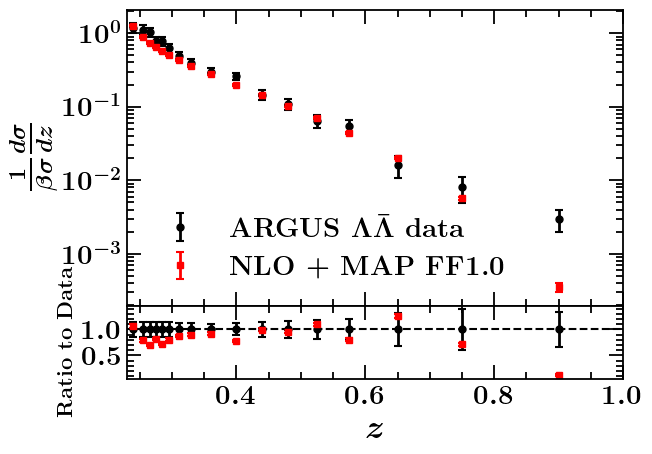

BELLE $\Lambda \bar{\Lambda}$
exun [4.21373943e-02 4.30726131e-02 3.90564975e-02 3.40530469e-02
 2.80456770e-02 2.20445004e-02 1.60377679e-02 1.10343509e-02
 7.13950278e-03 4.74337433e-03 2.74233477e-03 1.64222410e-03
 8.50705589e-04 4.65188134e-04 1.92093727e-04 7.52130308e-05]
excv [0.776    0.788    0.721    0.635    0.519    0.399    0.289    0.198
 0.132    0.0866   0.0508   0.0292   0.015    0.00779  0.00284  0.000812]


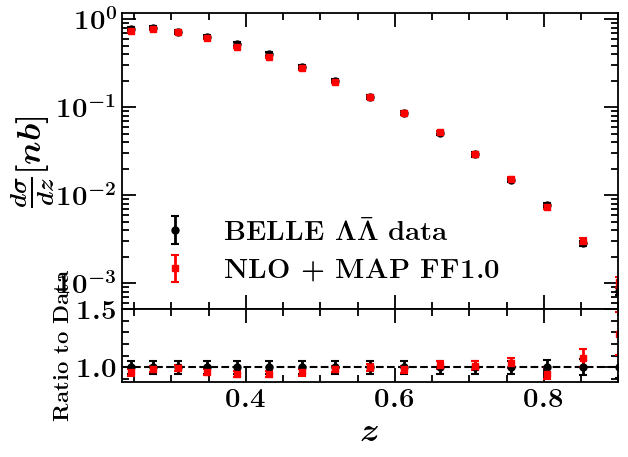

CELLO $\Lambda \bar{\Lambda}$
exun [1.37  0.49  0.37  0.18  0.12  0.07  0.026]
excv [3.25  2.32  1.48  0.7   0.32  0.15  0.048]


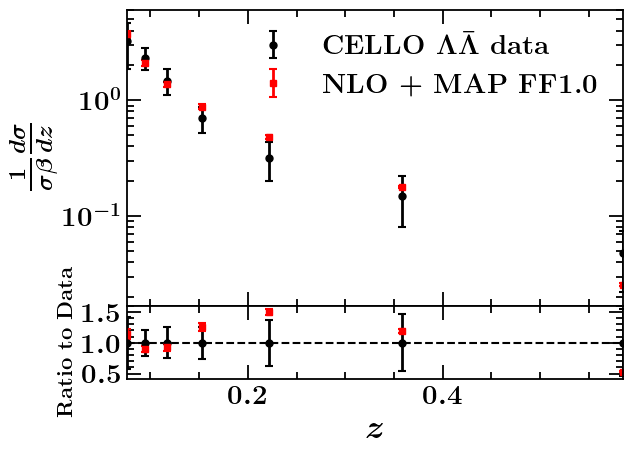

Delphi 91.2 GeV $\Lambda \bar{\Lambda}$
exun [0.16  0.09  0.1   0.05  0.04  0.03  0.032 0.025 0.019 0.02  0.019]
excv [2.69  3.76  3.54  2.84  1.8   1.17  0.774 0.555 0.303 0.121 0.072]


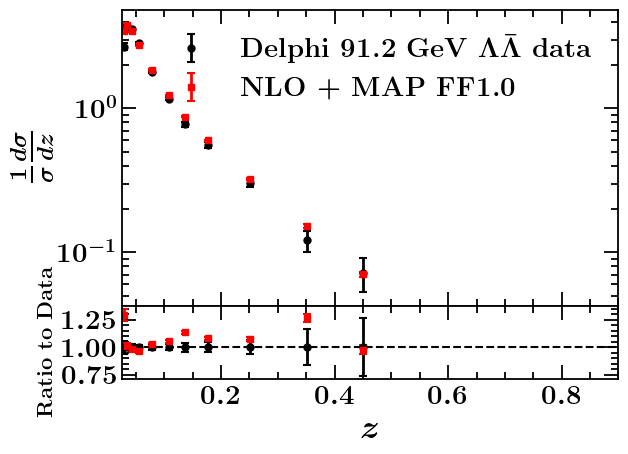

Delphi 183 GeV $\Lambda \bar{\Lambda}$
exun [0.027 0.023 0.024 0.029 0.021 0.023 0.027]
excv [0.034 0.05  0.1   0.157 0.081 0.056 0.034]


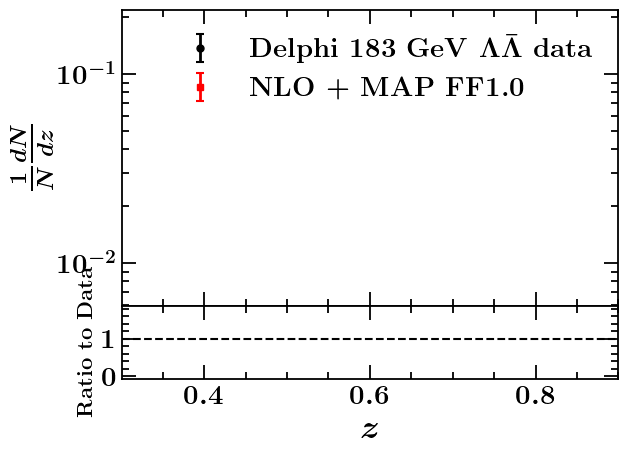

Delphi 189 GeV $\Lambda \bar{\Lambda}$
exun [0.017 0.02  0.017 0.015 0.016 0.015 0.021 0.005]
excv [0.025 0.081 0.133 0.133 0.121 0.06  0.072 0.004]


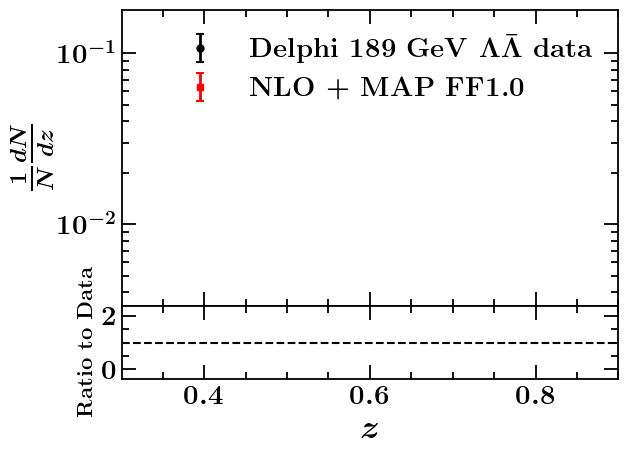

HRS $\Lambda \bar{\Lambda}$
exun [285.28231631  83.15623849  57.65899756  49.07229361  31.96623218
  21.33354167  14.71393897  11.75159564  11.10180166   7.71556868
   3.74833296   1.18701306]
excv [1053.   514.   355.2  307.4  198.7  150.3   86.    52.5   51.2   28.8
   11.1    2. ]


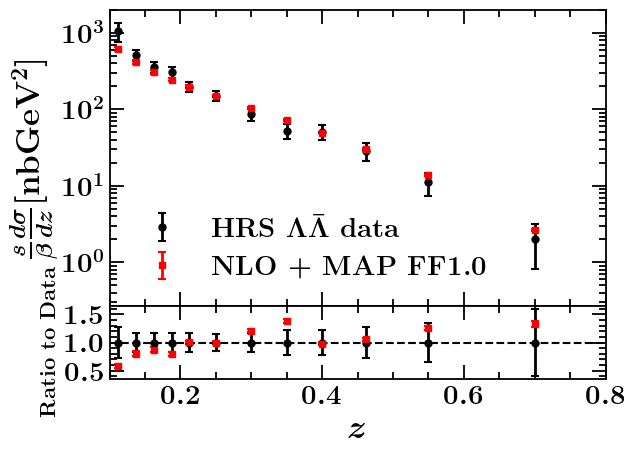

MARK II $\Lambda \bar{\Lambda}$
exun [358.6 153.2  68.6  45.5  29.   30.8  21.2  19.   14.9  13.3   8.1   5.8
   3.4   3.3   2.7]
excv [2.3181e+03 1.2119e+03 6.3660e+02 3.9550e+02 2.1990e+02 2.3560e+02
 1.4290e+02 1.1730e+02 7.9900e+01 5.8400e+01 3.7800e+01 2.0000e+01
 1.0200e+01 3.0000e+00 1.1000e+00]


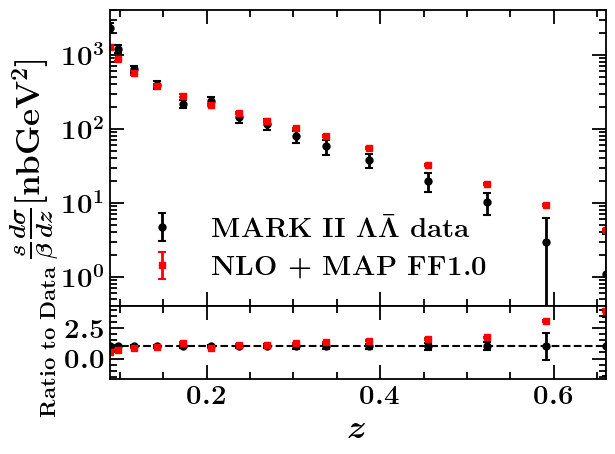

OPAL $\Lambda \bar{\Lambda}$
exun [0.40261644 0.31400637 0.25495098 0.21587033 0.18439089 0.13152946
 0.09831073 0.08178631 0.06001666 0.03962323 0.02236068 0.01044031
 0.0067082  0.00360555 0.00141421]
excv [5.64  4.59  3.63  3.11  2.63  1.98  1.452 1.184 0.883 0.585 0.329 0.148
 0.086 0.032 0.01 ]


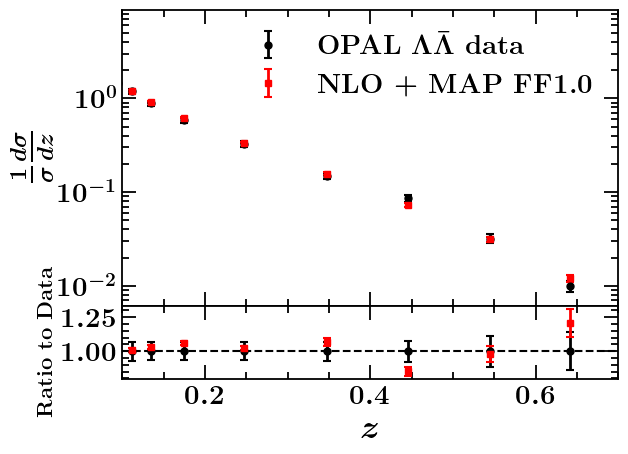

SLD B $\Lambda \bar{\Lambda}$
exun [1.2  0.79 0.5  0.34 0.25 0.17 0.09 0.04]
excv [2.8  4.19 2.39 2.47 1.44 1.1  0.6  0.2 ]


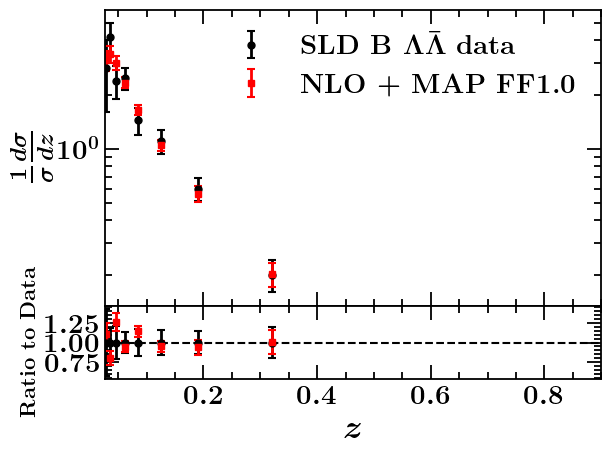

SLD C $\Lambda \bar{\Lambda}$
exun [3.3  2.   1.5  0.97 0.72 0.54 0.32 0.19]
excv [ 1.5   2.5   4.5   3.56  2.89  0.54  0.56 -0.13]


ValueError: 'yerr' must not contain negative values

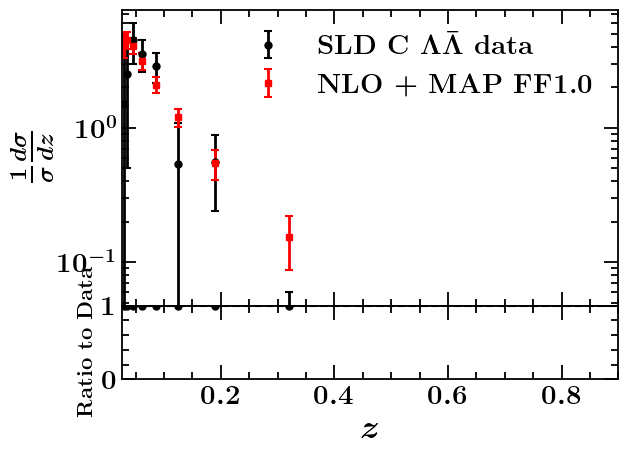

In [73]:
# SIA experiments
with open(FIT_FOLDER + "/Predictions.yaml", "r") as p:
    preds = yaml.load(p, Loader = yaml.CLoader)
    for e in preds:
        for exp, points in e.items():
            if ("COMPASS" in exp) or ("HERMES" in exp):
                continue
            print(exp)
            zav  = np.array([pt["zav"] for pt in points])
            zmin = np.array([pt["zmin"] for pt in points])
            zmax = np.array([pt["zmax"] for pt in points])
            excv = np.array([pt["exp. central value"] for pt in points])
            exun = np.array([pt["exp. unc."] for pt in points])
            thcv = np.array([pt["prediction"] for pt in points])
            thun = np.array([pt["pred. unc."] for pt in points])

            f, (ax1, ax2) = plt.subplots(2, 1, sharex = "all", gridspec_kw = dict(width_ratios = [1], height_ratios = [4, 1]))
            plt.subplots_adjust(wspace = 0, hspace = 0)

            # Upper panel
            ax1.set_xlim(xlims[exp])
            #ax1.set_ylim(ylims1[exp])
            ax1.set_ylabel(ylabels[exp])
            ax1.set_yscale("log")
            if xlog[exp]:
                ax1.set_xscale("log")
            ax1.errorbar(zav, excv, exun, elinewidth = 2, capsize = 3, capthick = 1.5, label = r"\textbf{" + exp + " data}", markersize = 5, fmt = "ko")
            if binints[exp]:
                ax1.bar(zmin, 2 * thun, bottom = thcv - thun, width = zmax - zmin, align = "edge", color = "red", label = r"\textbf{NLO + MAP FF1.0}", alpha = 0.5)
            else:
                ax1.errorbar(zav, thcv, thun, elinewidth = 2, capsize = 3, capthick = 1.5, label = r"\textbf{NLO + MAP FF1.0}", markersize = 4, fmt = "rs")
            ax1.legend(fontsize = 20)

            # Lower panel
            ax2.set_xlim(xlims[exp])
            #ax2.set_ylim(ylims2[exp])
            ax2.set_xlabel(r"$z$")
            ax2.set_ylabel(r"\textbf{Ratio to Data}", fontsize = 16)
            if xlog[exp]:
                ax2.set_xscale("log")
            ax2.axhline(y = 1, c = "k", ls = "--", lw = 1.5)
            print(f"exun {exun}")
            print(f"excv {excv}")
            ax2.errorbar(zav, excv/excv, exun/excv, elinewidth = 2, capsize = 3, capthick = 1.5, markersize = 5, fmt = "ko")
            if binints[exp]:
                ax2.bar(zmin, 2 * thun/excv, bottom = (thcv - thun)/excv, width = zmax - zmin, align = "edge", color = "red", alpha = 0.5)
            else:
                ax2.errorbar(zav, thcv/excv, thun/excv, elinewidth = 2, capsize = 3, capthick = 1.5, markersize = 5, fmt = "rs")

            plt.savefig(FIT_FOLDER + "/plots/" + plotfiles[exp] + ".pdf")
            plt.show()
            plt.close()

In [27]:
# Upload sets and declare uncertainty type
lh.pathsAppend(str(FIT_FOLDER))
ffs = [lh.mkPDFs("LHAPDFSet")]
unc = ["montecarlo"]
colff = ["orange"]
nameff = [r"\textbf{MAP Lambda FF}"]

# Function that returns the central values
def ComputeCentralValueAndUncertainty(x, Q, comb):
    centralvalue = []
    uncertainty  = []
    for s in zip(ffs, unc):
        if s[1] == "hessian":
            # In the case of a hessian set, use replica 0 as central value
            cv = 0
            f = s[0][0].xfxQ(x, Q)
            for k, v in comb.items():
                cv += v * f[k]
            err = 0
            for im in range(int((len(s[0]) - 1)/2)):
                fp = s[0][2*im+1].xfxQ(x, Q)
                fm = s[0][2*im+2].xfxQ(x, Q)
                t = 0
                for k, v in comb.items():
                    t += v * fp[k]
                    t -= v * fm[k]
                err += t**2
            centralvalue.append(cv)
            uncertainty.append(np.sqrt(err)/2)            
        elif s[1] == "montecarlo":
            # In case of a MC set, compute the average and standard deviation (do not include replica 0)
            cv  = 0
            cv2 = 0
            for irep in range(1, len(s[0])):
                f = s[0][irep].xfxQ(x, Q)
                t = 0
                for k, v in comb.items():
                    t += v * f[k]
                cv  += t / ( len(s[0]) - 1 )
                cv2 += t**2 / ( len(s[0]) - 1 )
            centralvalue.append(cv)
            uncertainty.append(np.sqrt(cv2 - cv**2))
        else:
            sys.exit("Unknown error: ", s[1])
    return centralvalue, uncertainty

LHAPDF 6.5.4 loading all 151 PDFs in set LHAPDFSet
LHAPDFSet, version 1; 151 PDF members


In [70]:
# FF plot settings

# Scale
Q = 5

# Grid in x
xv = np.logspace(-2, -0.0001, 1000)

# Combinations to be plotted
combs = [{21: 1}, # g
         {1: 1, -1: 1, 2: 1, -2: 1, 3: 1, -3: 1}, # u+ + d+ + s+
         {1: 1, -1: 1},                           # d+              
         {2: 1, -2: 1},                           # u+          
         {3: 1, -3: 1},                           # s+          
         {4: 1, -4: 1},                           # c+          
         {5: 1, -5: 1},                           # b+                      
         #{3: 1, -3: -1},                          # s-          
         #{1: 1, -1: -1}                           # d-          
         ]
labels = [r"$zD_g^{\Lambda}(z,Q)$", 
          r"$zD_{d^++u^++s^+}^{\Lambda}(z,Q)$",
          r"$zD_{d^+}^{\Lambda}(z,Q)$", 
          r"$zD_{u^+}^{\Lambda}(z,Q)$", 
          r"$zD_{s^+}^{\Lambda}(z,Q)$", 
          r"$zD_{c^+}^{\Lambda}(z,Q)$", 
          r"$zD_{b^+}^{\Lambda}(z,Q)$", 
          #r"$zD_{s^-}^{\Lambda}(z,Q)$", 
          #r"$zD_{d^-}^{\Lambda}(z,Q)$"
          ]
ylim1 = [[-0.01, 0.04],   
         [-0.01, 0.3],    
         [-0.01, 0.18],    
         [-0.01, 0.1],    
         [-0.01, 0.2],    
         [-0.01, 0.15],    
         [-0.01, 0.1],    
         #[-0.01, 0.1],           
         #[-0.01, 0.1],
         ]         
pdfname = ["Dg", 
           "Ddusp",
           "Ddp",
           "Dup",
           "Dsp",
           "Dcp",
           "Dbp",
           #"Dsm",
           #"Ddm"
           ]

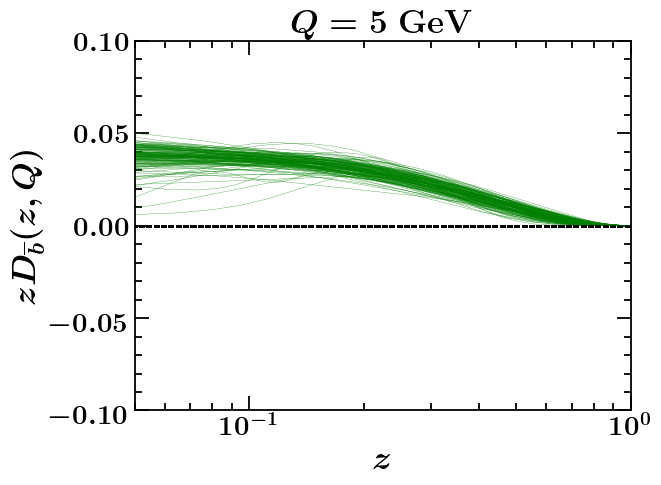

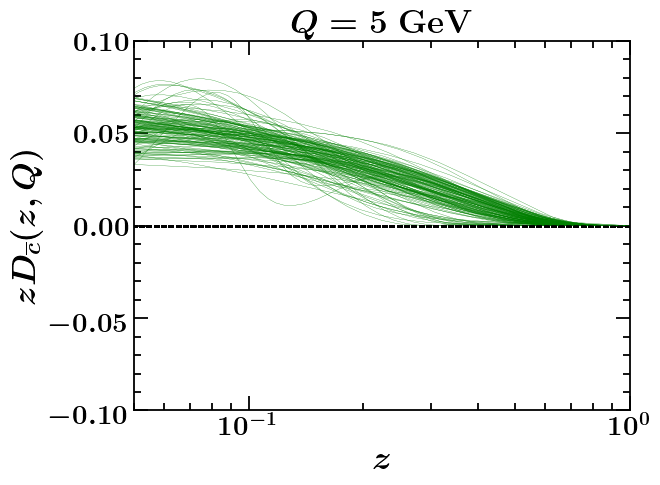

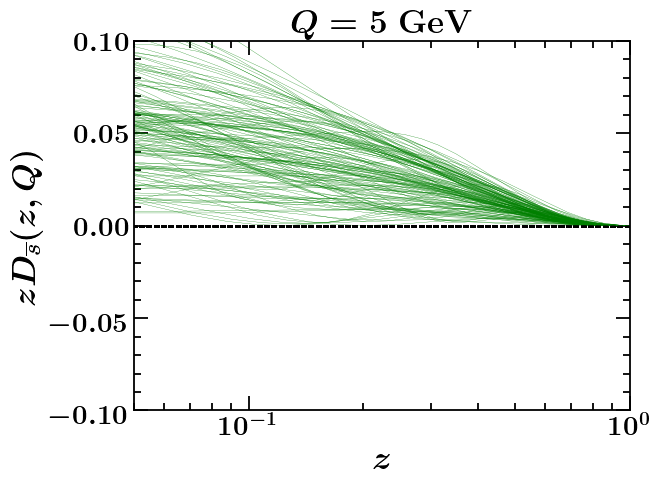

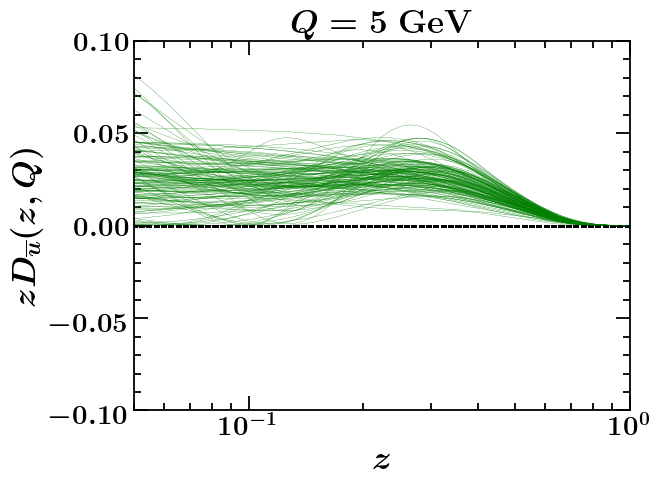

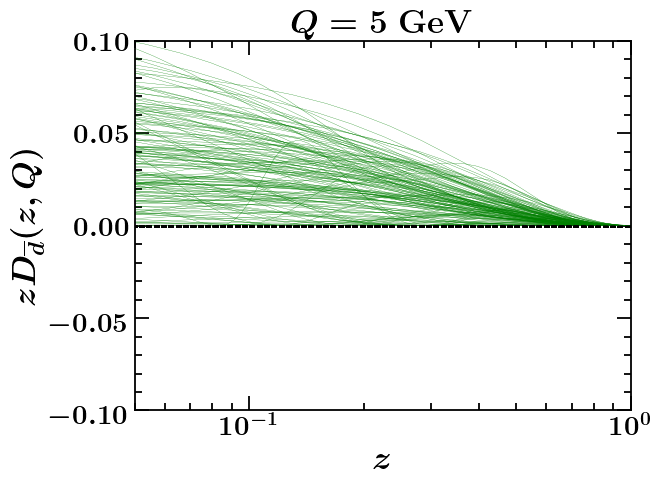

...

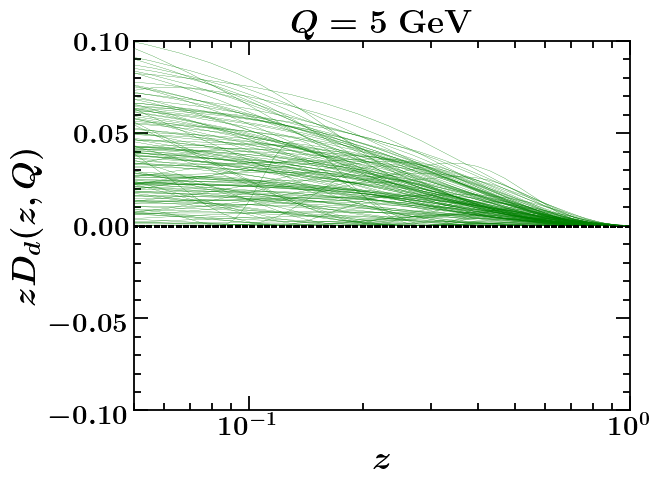

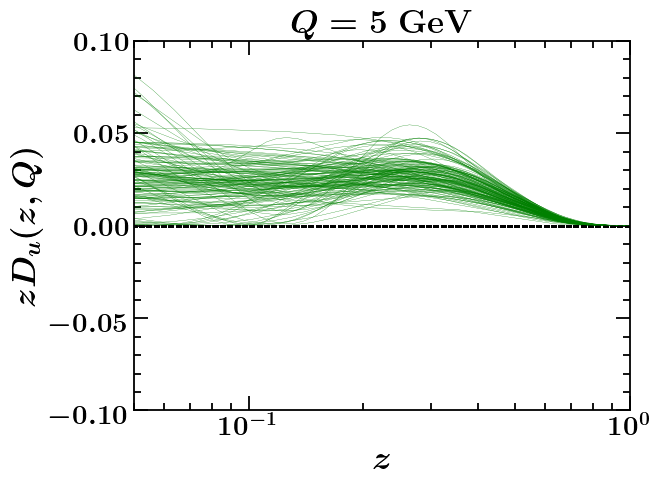

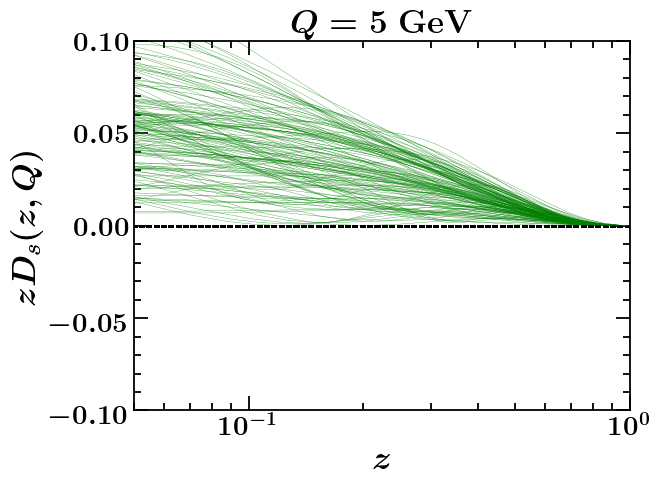

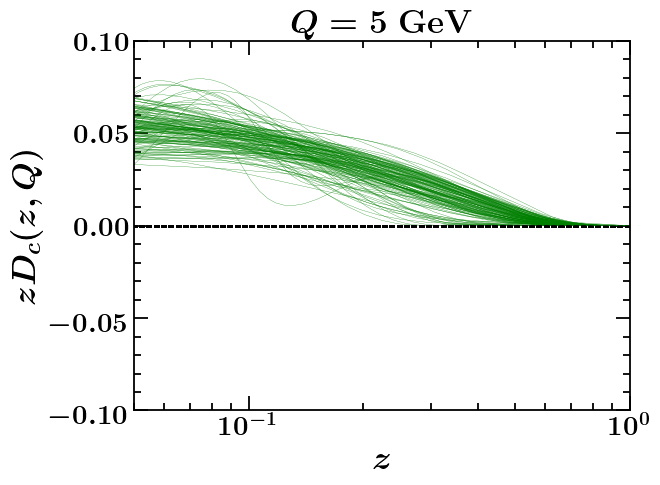

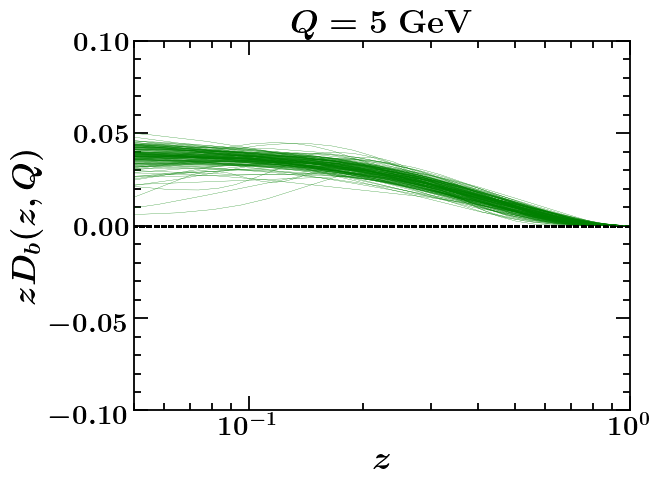

In [31]:
# Plot single replicas of the current fit for all flavours
labelmap = {-5: "\overline{b}", -4: "\overline{c}", -3: "\overline{s}", -2: "\overline{u}", -1: "\overline{d}", 0: "g", 1: "d", 2: "u", 3: "s", 4: "c", 5: "b"}
for ifl in range(-5,6):
    xf = [ffs[0][0].xfxQ(ifl, 0.1, Q) for x in xv]
    
    plt.title(r"$Q = " + str(Q) + r"$ \textbf{GeV}")
    plt.ylabel(r"$zD_{" + labelmap[ifl] + r"}(z, Q)$")
    plt.xlabel(r"$z$")
    plt.xlim(0.05, 1)
    plt.xscale("log")
    plt.ylim(-0.1, 0.1)
    for ff in ffs[0]:
        plt.plot(xv, [ff.xfxQ(ifl, x, Q) for x in xv], color = "green", ls = "-", lw = 0.2)
        plt.plot(xv, xv - xv, color = "black", ls = "--", lw = 1)
    plt.show()
    plt.close()



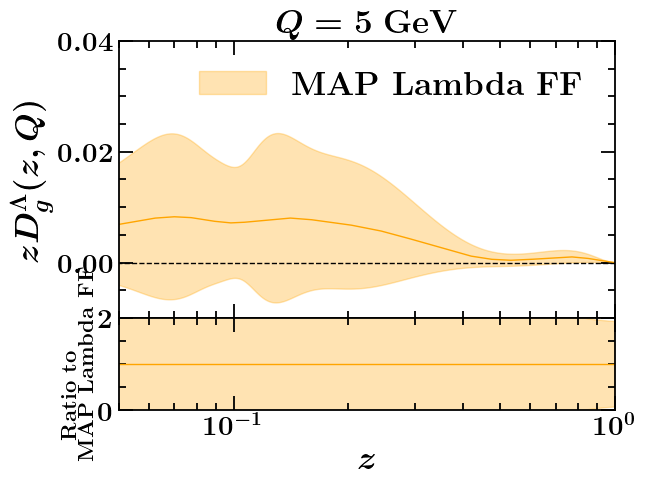

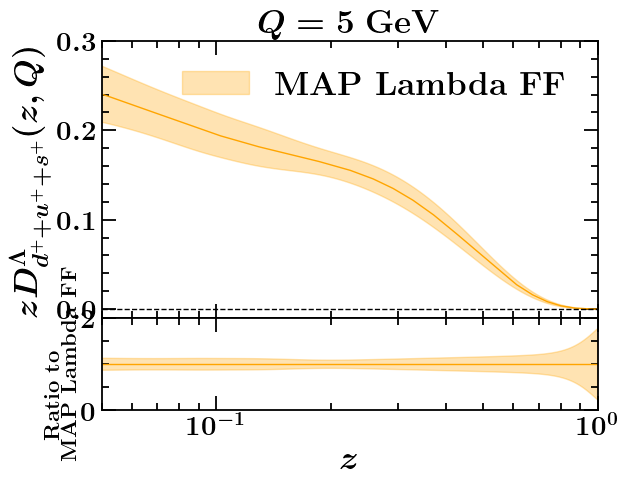

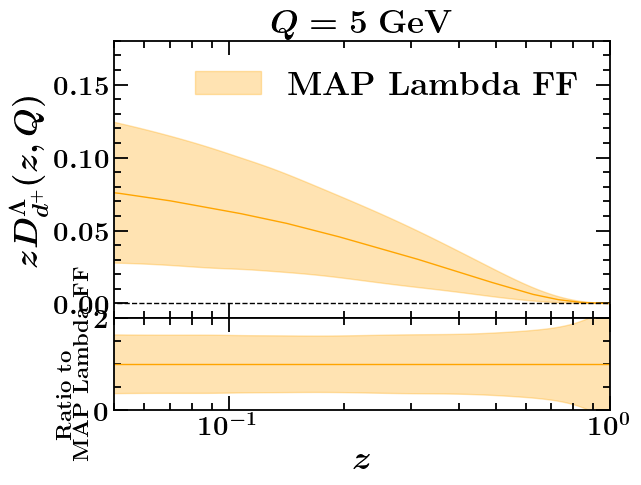

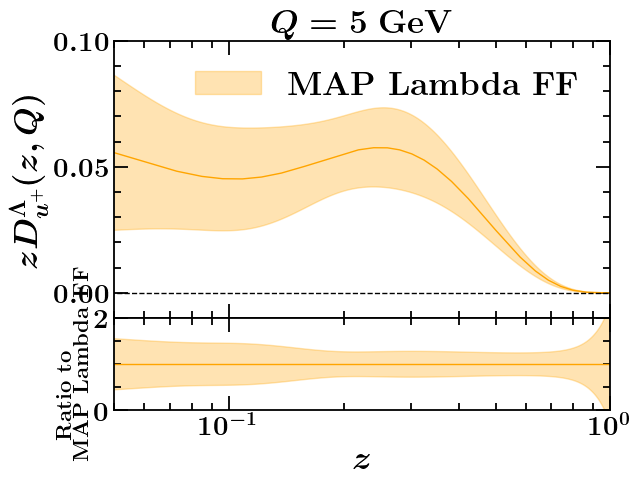

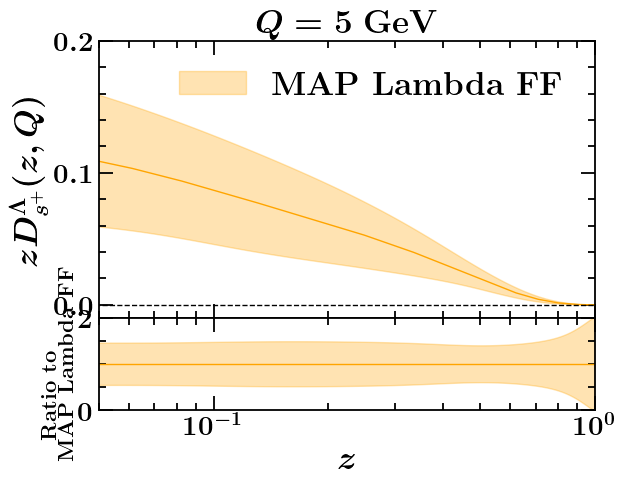

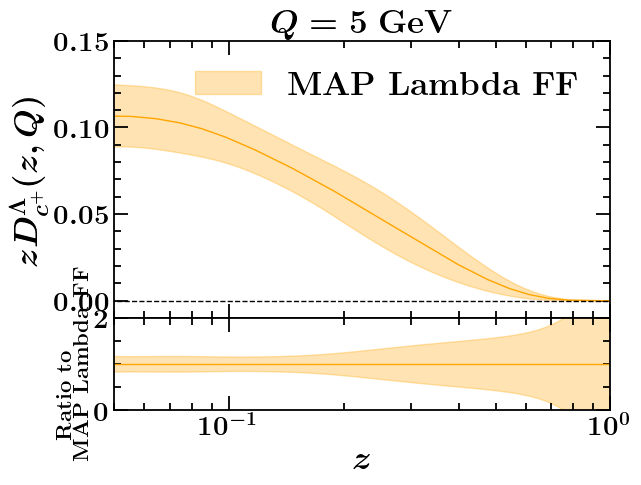

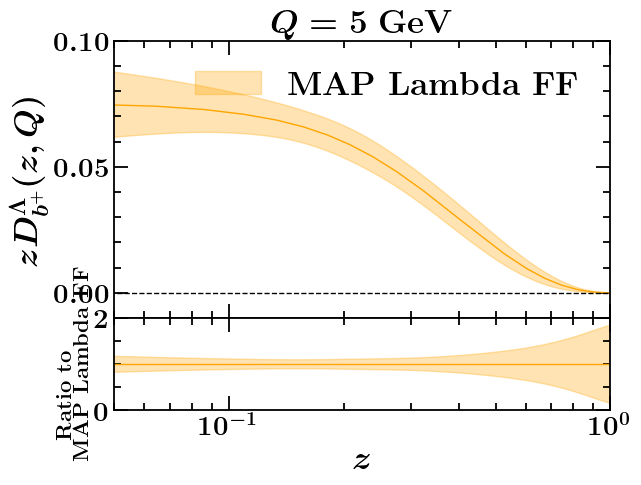

In [71]:
# Plot FFs
for cm in zip(combs, labels, ylim1, pdfname):
    fv  = []
    dfv = []
    for x in xv:
        cv, err = ComputeCentralValueAndUncertainty(x, Q, cm[0])
        fv.append(cv)
        dfv.append(err)
    # Transpose results
    fv  = list(map(list, zip(*fv)))
    dfv = list(map(list, zip(*dfv)))

    # Setup plot
    f, (ax1, ax2) = plt.subplots(2, 1, sharex = "all", gridspec_kw = dict(width_ratios = [1], height_ratios = [3, 1]))
    plt.subplots_adjust(wspace = 0, hspace = 0)
    
    ax1.set_title(r"$Q = " + str(Q) + r"$ \textbf{GeV}")
    ax1.set_ylabel(cm[1])
    ax1.set_xlim([0.05, 1])
    ax1.set_xscale("log")
    ax1.set_ylim(cm[2])
    
    ax2.set_xlabel(r"$z$")
    ax2.set_ylabel(r"\textbf{Ratio to}\\ \textbf{" + nameff[0] + "}", fontsize = 16)
    ax2.set_xlim([0.05, 1])
    ax2.set_xscale("log")
    ax2.set_ylim([0, 2])

    for iset in range(len(fv)):
        ax1.plot(xv, fv[iset], color = colff[iset], ls = "-", lw = 1)
        ax1.fill_between(xv, np.array(fv[iset]) + np.array(dfv[iset]), np.array(fv[iset]) - np.array(dfv[iset]), color = colff[iset], alpha = 0.3, label = nameff[iset])
        ax1.plot(xv, xv - xv, color = "black", ls = "--", lw = 1)
        ax2.plot(xv, np.array(fv[iset])/np.array(fv[0]), color = colff[iset], ls = "-", lw = 1)
        ax2.fill_between(xv, (np.array(fv[iset])+np.array(dfv[iset]))/np.array(fv[0]), (np.array(fv[iset])-np.array(dfv[iset]))/np.array(fv[0]), color = colff[iset], alpha = 0.3)
    ax1.legend()

    plt.savefig(FIT_FOLDER + "/plots/" + cm[3] + ".pdf")
    plt.show()
    plt.close()